In [ ]:
#import libraries
import numpy as np
import pandas as pd
from google.colab import files
import csv


import matplotlib.pyplot as plt
import seaborn as sb 
%matplotlib inline
plt.show()

In [ ]:
#uploading the files from local storage to cloud
print("Upload your dataset\n")
uploaded = files.upload()

Upload your dataset



Saving EVCS-location-US-Canada.csv to EVCS-location-US-Canada.csv


In [ ]:
#loading the dataset
df = pd.read_csv("EVCS-location-US-Canada.csv")

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (20,31,39,46,64) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [ ]:
#Data Profiling and Cleaning
#Shaping the data
# obtain the shape of a DataFrame
df.shape

(57164, 65)

In [ ]:
#Displaying the dataset
df

,Fuel Type Code,Station Name,Street Address,Intersection Directions,City,State,ZIP,Plus4,Station Phone,Status Code,...,EV Pricing (French),LPG Nozzle Types,Hydrogen Pressures,Hydrogen Standards,CNG Fill Type Code,CNG PSI,CNG Vehicle Class,LNG Vehicle Class,EV On-Site Renewable Source,Restricted Access
0,ELEC,Los Angeles Convention Center,1201 S Figueroa St,West hall and South hall,Los Angeles,CA,90015,NaN,213-741-1151,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
1,ELEC,California Air Resources Board,9530 Telstar Ave,NaN,El Monte,CA,91731,NaN,626-575-6800,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
2,ELEC,Scripps Green Hospital,10666 N Torrey Pines Rd,"Patient Parking Structure, level G",La Jolla,CA,92037,NaN,NaN,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
3,ELEC,Galpin Motors,15421 Roscoe Blvd,NaN,Sepulveda,CA,91343,NaN,800-256-6219,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
4,ELEC,Galleria at Tyler,1299 Galleria at Tyler,NaN,Riverside,CA,92503,NaN,951-351-3110,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57159,ELEC,Goodyear Plaza,409 N Litchfield Rd,NaN,Goodyear,AZ,85338,NaN,877-455-3833,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57160,ELEC,HELCO-Puna Kai Shopping Center,15-2714 Pahoa Village Rd,NaN,Pahoa,HI,96778,NaN,855-900-7584,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57161,ELEC,Latitude - 5265 Natorp,5265 Natrop Blvd,NaN,Mason,OH,45040,NaN,888-356-8911,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
57162,ELEC,13601 Glenoaks blvd,13601 Glenoaks blvd,NaN,Los Angeles,CA,91342,NaN,888-356-8911,E,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
#View the details of the dataset
def info(x):
  return x.info()
info(df)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57164 entries, 0 to 57163
Data columns (total 65 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Fuel Type Code                    57164 non-null  object 
 1   Station Name                      57164 non-null  object 
 2   Street Address                    57164 non-null  object 
 3   Intersection Directions           2186 non-null   object 
 4   City                              57164 non-null  object 
 5   State                             57164 non-null  object 
 6   ZIP                               57163 non-null  object 
 7   Plus4                             0 non-null      float64
 8   Station Phone                     56430 non-null  object 
 9   Status Code                       57164 non-null  object 
 10  Expected Date                     0 non-null      float64
 11  Groups With Access Code           57164 non-null  object 
 12  Acce

In [ ]:
#find all missing column with sum()
def missing_values(x):
    null_columns=x.columns[x.isnull().any()]
    return print('====='*6,'\n','Sum Of Missing Values''\n','====='*6,'\n',x[null_columns].isnull().sum())
missing_values(df)




 Sum Of Missing Values
 Intersection Directions             54978
ZIP                                     1
Plus4                               57164
Station Phone                         734
Expected Date                       57164
Access Days Time                      171
Cards Accepted                      53849
BD Blends                           57164
NG Fill Type Code                   57164
NG PSI                              57164
EV Level1 EVSE Num                  56852
EV Level2 EVSE Num                   6501
EV DC Fast Count                    49359
EV Other Info                       57115
EV Network Web                       6851
Geocode Status                         14
Date Last Confirmed                   181
Owner Type Code                     40500
Federal Agency ID                   57102
Federal Agency Name                 57102
Open Date                              27
Hydrogen Status Link                57164
NG Vehicle Class                    57164
LPG Primar

In [ ]:
#Findding the percentage of the missing values
def percent_missing(x):
    null_columns=x.columns[x.isnull().any()]
    total_missing = x[null_columns].isnull().sum()
    percentage = total_missing / len(x)*100
    return print('====='*6,'\n','Percentage Of Missing Values''\n','====='*6,'\n',percentage)
percent_missing(df)

 Percentage Of Missing Values
 Intersection Directions              96.175915
ZIP                                   0.001749
Plus4                               100.000000
Station Phone                         1.284025
Expected Date                       100.000000
Access Days Time                      0.299139
Cards Accepted                       94.200896
BD Blends                           100.000000
NG Fill Type Code                   100.000000
NG PSI                              100.000000
EV Level1 EVSE Num                   99.454202
EV Level2 EVSE Num                   11.372542
EV DC Fast Count                     86.346302
EV Other Info                        99.914282
EV Network Web                       11.984816
Geocode Status                        0.024491
Date Last Confirmed                   0.316633
Owner Type Code                      70.848786
Federal Agency ID                    99.891540
Federal Agency Name                  99.891540
Open Date                    

In [ ]:
#dropping all the columns with high number of missing values
to_drop = ['EV On-Site Renewable Source','LNG Vehicle Class','CNG Vehicle Class','CNG PSI','CNG Fill Type Code','Hydrogen Standards','Hydrogen Pressures',
           'LPG Nozzle Types','EV Pricing (French)','EV Pricing','Intersection Directions','Plus4','Expected Date','Cards Accepted','BD Blends','NG Fill Type Code',
           'NG PSI','EV Level1 EVSE Num','EV DC Fast Count','EV Other Info','Owner Type Code','Federal Agency ID','Federal Agency Name','Hydrogen Status Link',
           'NG Vehicle Class','LPG Primary','E85 Blender Pump','Intersection Directions (French)','Access Days Time (French)','BD Blends (French)','Hydrogen Is Retail',
           'Access Detail Code' ,'Federal Agency Code' ,'Facility Type','CNG Dispenser Num','CNG On-Site Renewable Source','CNG Total Compression Capacity','CNG Storage Capacity',
           'LNG On-Site Renewable Source','E85 Other Ethanol Blends']

df.drop(to_drop, inplace=True, axis=1)

In [ ]:
#We have removed all no values from 65 columns to 25
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57164 entries, 0 to 57163
Data columns (total 25 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Fuel Type Code                    57164 non-null  object 
 1   Station Name                      57164 non-null  object 
 2   Street Address                    57164 non-null  object 
 3   City                              57164 non-null  object 
 4   State                             57164 non-null  object 
 5   ZIP                               57163 non-null  object 
 6   Station Phone                     56430 non-null  object 
 7   Status Code                       57164 non-null  object 
 8   Groups With Access Code           57164 non-null  object 
 9   Access Days Time                  56993 non-null  object 
 10  EV Level2 EVSE Num                50663 non-null  float64
 11  EV Network                        57164 non-null  object 
 12  EV N

In [ ]:
df['EV Level2 EVSE Num']

0        12.0
1         3.0
2         1.0
3         2.0
4         4.0
         ... 
57159     NaN
57160     NaN
57161     2.0
57162     1.0
57163     1.0
Name: EV Level2 EVSE Num, Length: 57164, dtype: float64

In [ ]:
#Data reduction prepare for EDA analysis

redData = ['Fuel Type Code','Geocode Status','ID','Restricted Access','Access Code','Status Code',
           'EV Network Web']

df = df.drop(['Fuel Type Code','Geocode Status','ID','Restricted Access','Access Code','Status Code','EV Network Web'], axis = 1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57164 entries, 0 to 57163
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   Station Name                      57164 non-null  object 
 1   Street Address                    57164 non-null  object 
 2   City                              57164 non-null  object 
 3   State                             57164 non-null  object 
 4   ZIP                               57163 non-null  object 
 5   Station Phone                     56430 non-null  object 
 6   Groups With Access Code           57164 non-null  object 
 7   Access Days Time                  56993 non-null  object 
 8   EV Level2 EVSE Num                50663 non-null  float64
 9   EV Network                        57164 non-null  object 
 10  Latitude                          57164 non-null  float64
 11  Longitude                         57164 non-null  float64
 12  Date

In [ ]:
#See what columns are available
df.columns

Index(['Station Name', 'Street Address', 'City', 'State', 'ZIP',
       'Station Phone', 'Groups With Access Code', 'Access Days Time',
       'EV Level2 EVSE Num', 'EV Network', 'Latitude', 'Longitude',
       'Date Last Confirmed', 'Updated At', 'Open Date', 'EV Connector Types',
       'Country', 'Groups With Access Code (French)'],
      dtype='object')

In [ ]:
# #Create a data dictionary of the same dataset
data = csv.DictReader(open("EVCS-location-US-Canada.csv"))
print("EVCS-location-US-Canada.csv file as a dictionary:\n")
for row in data:
   print(row)

EVCS-location-US-Canada.csv file as a dictionary:

{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'Los Angeles Convention Center', 'Street Address': '1201 S Figueroa St', 'Intersection Directions': 'West hall and South hall', 'City': 'Los Angeles', 'State': 'CA', 'ZIP': '90015', 'Plus4': '', 'Station Phone': '213-741-1151', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily; pay lot', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '12', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'Non-Networked', 'EV Network Web': '', 'Geocode Status': 'GPS', 'Latitude': '34.040539', 'Longitude': '-118.271387', 'Date Last Confirmed': '2020-11-09', 'ID': '1523', 'Updated At': '2021-03-11 23:22:17 UTC', 'Owner Type Code': 'P', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '1995-08-30', 'Hydrogen Status Link': '', 'NG Vehicle Clas

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'Hans Fahden Winery - Tesla Destination', 'Street Address': '4855 Petrified Forest Rd', 'Intersection Directions': '', 'City': 'Calistoga', 'State': 'CA', 'ZIP': '94515', 'Plus4': '', 'Station Phone': '707-942-6760  877-798-3752', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public - Call ahead', 'Access Days Time': '24 hours daily; for customer use only', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '1', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'Tesla Destination', 'EV Network Web': 'https://www.tesla.com/destination-charging', 'Geocode Status': '200-8', 'Latitude': '38.559984', 'Longitude': '-122.629709', 'Date Last Confirmed': '2020-11-03', 'ID': '112892', 'Updated At': '2021-03-11 23:22:17 UTC', 'Owner Type Code': 'P', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2017-09-01', 'Hydrogen Status

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'BUILDING 7 EVCS STATION1', 'Street Address': '909 Reinli St', 'Intersection Directions': '', 'City': 'Austin', 'State': 'TX', 'ZIP': '78751', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '30.318426', 'Longitude': '-97.71069', 'Date Last Confirmed': '2022-08-22', 'ID': '146662', 'Updated At': '2022-08-22 01:14:25 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2019-10-08', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Connector Typ

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'STATION 1 TOWN OF LG', 'Street Address': '20 Old Post Rd', 'Intersection Directions': '', 'City': 'Lake George', 'State': 'NY', 'ZIP': '12845', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '43.431325', 'Longitude': '-73.717171', 'Date Last Confirmed': '2022-08-22', 'ID': '162366', 'Updated At': '2022-08-22 00:59:45 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2020-06-12', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Connector 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'Édifice 019', 'Street Address': '190 rue Dubé Édifice 019 - Base CANEX', 'Intersection Directions': '', 'City': 'Shannon', 'State': 'QC', 'ZIP': 'G0A 1R1', 'Plus4': '', 'Station Phone': '855-999-8378', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '', 'EV DC Fast Count': '1', 'EV Other Info': '', 'EV Network': 'Circuit électrique', 'EV Network Web': 'https://lecircuitelectrique.com/', 'Geocode Status': 'GPS', 'Latitude': '46.888031', 'Longitude': '-71.50482', 'Date Last Confirmed': '2022-08-22', 'ID': '165693', 'Updated At': '2022-08-22 02:09:44 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2020-08-28', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'Triumph Lending - Tesla Destination', 'Street Address': '12075 Spring Cypress Rd', 'Intersection Directions': '', 'City': 'Houston', 'State': 'TX', 'ZIP': '77377', 'Plus4': '', 'Station Phone': '877-798-3752  877-798-3752', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily; for customer use only; see front desk for access', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '4', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'Tesla Destination', 'EV Network Web': 'https://www.tesla.com/destination-charging', 'Geocode Status': 'GPS', 'Latitude': '30.012339', 'Longitude': '-95.612366', 'Date Last Confirmed': '2020-11-03', 'ID': '169222', 'Updated At': '2021-03-11 23:22:17 UTC', 'Owner Type Code': 'P', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2020-11-03', 'Hydrogen S

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'CITYOFBRENTWOOD STATION #8', 'Street Address': '100 City Park Way', 'Intersection Directions': '', 'City': 'Brentwood', 'State': 'CA', 'ZIP': '94513', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '1', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '37.934687', 'Longitude': '-121.693353', 'Date Last Confirmed': '2022-08-22', 'ID': '175873', 'Updated At': '2022-08-22 01:16:57 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2021-01-27', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Co

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'BEVERLY HILLS 450 N CRESCENT4', 'Street Address': '450 N Crescent Dr', 'Intersection Directions': '', 'City': 'Beverly Hills', 'State': 'CA', 'ZIP': '90210', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '34.073115', 'Longitude': '-118.401291', 'Date Last Confirmed': '2022-08-22', 'ID': '178591', 'Updated At': '2022-08-22 00:48:28 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2021-01-27', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '',

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': '750 MAIN STATION #3', 'Street Address': '750 Main St', 'Intersection Directions': '', 'City': 'Grand Junction', 'State': 'CO', 'ZIP': '81501', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '39.067696', 'Longitude': '-108.560023', 'Date Last Confirmed': '2022-08-22', 'ID': '181231', 'Updated At': '2022-08-22 01:24:53 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2021-01-27', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Connector 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': '7700 N PALM AVE PALM FALLBROOK2', 'Street Address': '7700 N Palm Ave', 'Intersection Directions': '', 'City': 'Fresno', 'State': 'CA', 'ZIP': '93711', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': 'Mon 4:00am - 10:30pm; Tue 4:00am - 10:30pm; Wed 4:00am - 10:30pm; Thu 4:00am - 10:30pm; Fri 4:00am - 10:30pm; Sat 4:00am - 10:30pm; Sun 4:00am - 10:30pm', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '36.849718', 'Longitude': '-119.804762', 'Date Last Confirmed': '2022-08-22', 'ID': '183371', 'Updated At': '2022-08-22 01:23:03 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency N

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'KSS 13480 03', 'Street Address': '13480 Evening Creek Dr N', 'Intersection Directions': '', 'City': 'San Diego', 'State': 'CA', 'ZIP': '92128', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '1', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '32.962406', 'Longitude': '-117.095238', 'Date Last Confirmed': '2022-08-22', 'ID': '189453', 'Updated At': '2022-08-22 01:28:51 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2021-05-11', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Connector

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'DAY 1 15', 'Street Address': '2751 Skypark Dr', 'Intersection Directions': '', 'City': 'Torrance', 'State': 'CA', 'ZIP': '90505', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '33.804864', 'Longitude': '-118.334739', 'Date Last Confirmed': '2022-08-22', 'ID': '193681', 'Updated At': '2022-08-22 01:30:24 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2021-08-10', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Connector Types': 'J17

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'ESF STATION 7', 'Street Address': 'Stadium Place', 'Intersection Directions': '', 'City': 'Syracuse', 'State': 'NY', 'ZIP': '13210', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '43.035249', 'Longitude': '-76.13968', 'Date Last Confirmed': '2022-08-22', 'ID': '197199', 'Updated At': '2022-08-22 01:34:28 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2021-10-07', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Connector Types': 'J17

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'CARVANARICHMOND RICHMOND', 'Street Address': '2201 Westwood Ave', 'Intersection Directions': '', 'City': 'Richmond', 'State': 'VA', 'ZIP': '23230', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '37.576976', 'Longitude': '-77.475113', 'Date Last Confirmed': '2022-08-22', 'ID': '201067', 'Updated At': '2022-08-22 01:35:29 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2021-11-13', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Conne

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'Stop&Shop 89 French King Highway', 'Street Address': '89 French King Hwy', 'Intersection Directions': '', 'City': 'Greenfield', 'State': 'MA', 'ZIP': '01301', 'Plus4': '', 'Station Phone': '888-264-2208', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public - Credit card at all times', 'Access Days Time': '6am-12am daily', 'Cards Accepted': 'A D Debit M V', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'Volta', 'EV Network Web': 'https://voltacharging.com/', 'Geocode Status': 'GPS', 'Latitude': '42.6068734991068', 'Longitude': '-72.5740085326093', 'Date Last Confirmed': '2022-05-05', 'ID': '205159', 'Updated At': '2022-05-05 20:22:04 UTC', 'Owner Type Code': 'P', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2022-01-18', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', '

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'CENTRAL CENTRAL 3', 'Street Address': '8455 Fenton St', 'Intersection Directions': '', 'City': 'Silver Spring', 'State': 'MD', 'ZIP': '20910', 'Plus4': '', 'Station Phone': '888-758-4389', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public', 'Access Days Time': '24 hours daily', 'Cards Accepted': '', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '2', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'ChargePoint Network', 'EV Network Web': 'http://www.chargepoint.com/', 'Geocode Status': 'GPS', 'Latitude': '38.99486', 'Longitude': '-77.02375', 'Date Last Confirmed': '2022-08-22', 'ID': '213184', 'Updated At': '2022-08-22 01:18:25 UTC', 'Owner Type Code': '', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2022-04-01', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 'E85 Blender Pump': '', 'EV Connector Ty

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'\ufeffFuel Type Code': 'ELEC', 'Station Name': 'PF CA MP Kenson', 'Street Address': '650 Live Oak Ave', 'Intersection Directions': '', 'City': 'Menlo Park', 'State': 'CA', 'ZIP': '94025', 'Plus4': '', 'Station Phone': '833-479-7359', 'Status Code': 'E', 'Expected Date': '', 'Groups With Access Code': 'Public - Credit card at all times', 'Access Days Time': '24 hours daily', 'Cards Accepted': 'ACCOUNT_BALANCE CREDIT', 'BD Blends': '', 'NG Fill Type Code': '', 'NG PSI': '', 'EV Level1 EVSE Num': '', 'EV Level2 EVSE Num': '20', 'EV DC Fast Count': '', 'EV Other Info': '', 'EV Network': 'POWERFLEX', 'EV Network Web': 'https://www.powerflex.com', 'Geocode Status': '200-8', 'Latitude': '37.452235', 'Longitude': '-122.180929', 'Date Last Confirmed': '2022-08-10', 'ID': '221579', 'Updated At': '2022-08-10 13:32:10 UTC', 'Owner Type Code': 'P', 'Federal Agency ID': '', 'Federal Agency Name': '', 'Open Date': '2022-06-21', 'Hydrogen Status Link': '', 'NG Vehicle Class': '', 'LPG Primary': '', 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
#Statistics Summary
df.describe().T

,count,mean,std,min,25%,50%,75%,max
EV Level2 EVSE Num,50663.0,2.219075,2.171451,1.000000,2.000000,2.000000,2.000000,128.000000
Latitude,57164.0,38.751895,5.610176,1.000000,34.129098,38.960045,42.570347,64.852466
Longitude,57164.0,-96.533575,20.257341,-159.788556,-118.191450,-92.596927,-77.495371,40.432278


In [ ]:
#Putting an index
a=np.arange(1,57165)

In [ ]:
# Before we do EDA, lets separate Numerical and categorical variables for easy analysis
cat_cols=df.select_dtypes(include=['object']).columns
num_cols = df.select_dtypes(include=np.number).columns.tolist()
print("Categorical Variables:")
print(cat_cols)
print("Numerical Variables:")
print(num_cols)

Categorical Variables:
Index(['Station Name', 'Street Address', 'City', 'State', 'ZIP',
       'Station Phone', 'Groups With Access Code', 'Access Days Time',
       'EV Network', 'Date Last Confirmed', 'Updated At', 'Open Date',
       'EV Connector Types', 'Country', 'Groups With Access Code (French)'],
      dtype='object')
Numerical Variables:
['EV Level2 EVSE Num', 'Latitude', 'Longitude']


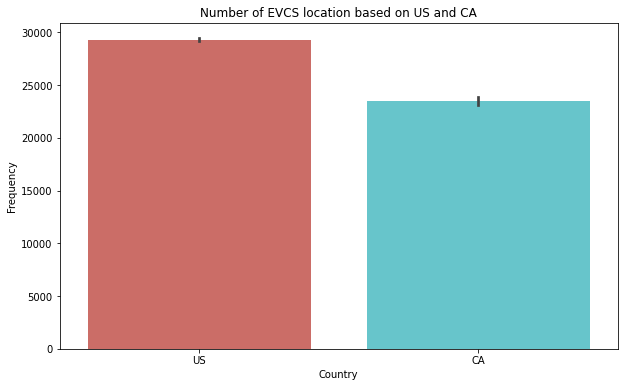

In [ ]:
#Number of EVCS location based on US and CA
ax= plt.figure(figsize=(10,6))
sb.barplot(x='Country',y=a,data=df, palette='hls')
plt.title('Number of EVCS location based on US and CA')
plt.xlabel('Country')
plt.ylabel('Frequency')
df['Country'] = df['Country'].replace(['Country'], 'Other Country')

EV Level2 EVSE Num
Skew : 13.52


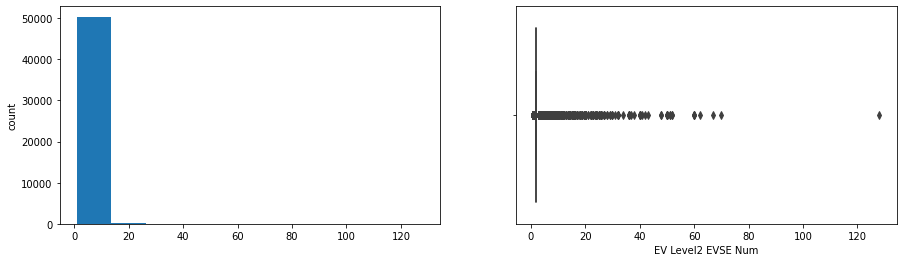

Latitude
Skew : -0.16


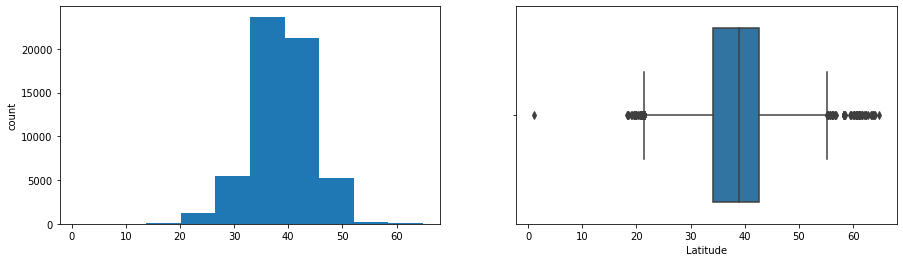

Longitude
Skew : -0.27


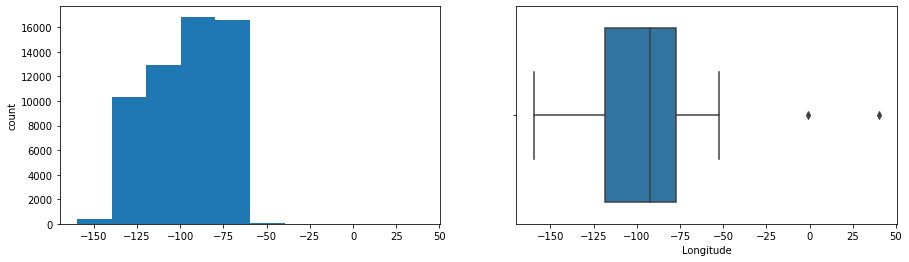

In [ ]:
#  histogram and box plot is used to show the pattern of the variables, 
# as some variables have skewness and outliers
for col in num_cols:
    print(col)
    print('Skew :', round(df[col].skew(), 2))
    plt.figure(figsize = (15, 4))
    plt.subplot(1, 2, 1)
    df[col].hist(grid=False)
    plt.ylabel('count')
    plt.subplot(1, 2, 2)
    sb.boxplot(x=df[col])
    plt.show()

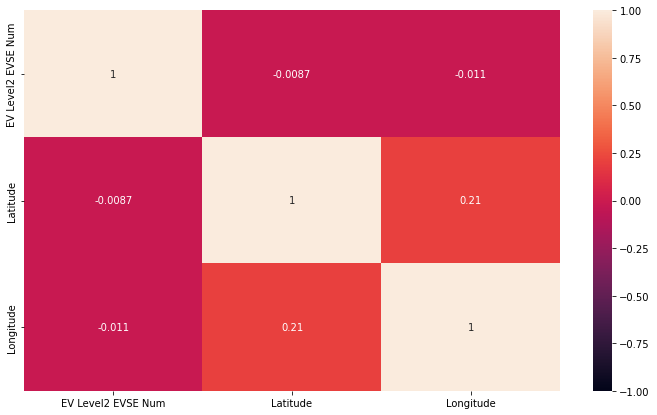

In [ ]:
plt.figure(figsize=(12, 7))
sb.heatmap(df.drop(['EV Connector Types','EV Network'],axis=1).corr(), annot = True, vmin = -1, vmax = 1)
plt.show()